<a href="https://colab.research.google.com/github/azhara001/Fabric-Composition-Extraction/blob/main/Inference_Script.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
## importing necessary HF packages -> if in google-colab, please uncomment the following lines and run them followed by restarting the kernel
# !pip install transformers[sentencepiece]
# !pip install tqdm
# !pip install datasets
# !pip install accelerate -U
# !pip install -q pytorch-lightning wandb

In [6]:
# mounting Google Drive (only necessary because I want to import an image from my local directory as a test image) -> an image would come directly
# from the front-end in our case as per my understanding
# mounting GoogleDrive
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Capstone_Repo

Mounted at /content/drive
/content/drive/MyDrive/Capstone_Repo


In [47]:
# importing the loaded pre-trained model from HF Hub -> all you need to run are the three lines of code to import model from HF
from transformers import DonutProcessor, VisionEncoderDecoderModel
import torch

processor = DonutProcessor.from_pretrained("azhara001/donut-base-demo-v2")
model = VisionEncoderDecoderModel.from_pretrained("azhara001/donut-base-demo-v2")

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [48]:
# importing dummy image + preprocessing steps of the input image
from PIL import Image
rgb_to_gray = False
downsample = False

image_path = '8038.jpg'

# reading the image using PIL
if rgb_to_gray:
  im = Image.open(image_path).convert('L')
else:
  im = Image.open(image_path)

# if we are getting a .jpg image from front-end then only execute the below lines
## ______________________ Preprocessing of input image _________________________

if im.size[0] < im.size[1]: # rotate image
    im = im.transpose(Image.ROTATE_90)

image_size = [1280, 960] # starting with the custom image size
processor.image_processor.size = image_size[::-1] # should be (width, height)
processor.image_processor.do_align_long_axis = False

pixel_values = processor(im, return_tensors="pt").pixel_values
print(pixel_values.shape)

task_prompt = "<s_demo_v1>"
decoder_input_ids = processor.tokenizer(task_prompt, add_special_tokens=False, return_tensors="pt")["input_ids"]


In [38]:
## calling the model and doing an inference

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

outputs = model.generate(pixel_values.to(device),
                               decoder_input_ids=decoder_input_ids.to(device),
                               max_length=model.decoder.config.max_position_embeddings,
                               early_stopping=True,
                               pad_token_id=processor.tokenizer.pad_token_id,
                               eos_token_id=processor.tokenizer.eos_token_id,
                               use_cache=True,
                               num_beams=1,
                               bad_words_ids=[[processor.tokenizer.unk_token_id]],
                               return_dict_in_generate=True,
                               output_scores=True,)

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(


In [50]:
## ______________________ Postprocessing of input image _________________________
import re
sequence = processor.batch_decode(outputs.sequences)[0]
sequence = sequence.replace(processor.tokenizer.eos_token, "").replace(processor.tokenizer.pad_token, "")
sequence = re.sub(r"<.*?>", "", sequence, count=1).strip()  # remove first task start token
processor.token2json(sequence)

{'sample_id': '8038.0',
 'composition': {'polyester': 'None',
  'elastane': 'None',
  'rayon': 'None',
  'cotton': 'None',
  'tencel': 'None',
  'nylon': 'None',
  'viscose': '100.0',
  'modal': 'None',
  'nylon_6': 'None',
  'nylon_66': 'None',
  'cupro': 'None',
  'micromodal': 'None'}}

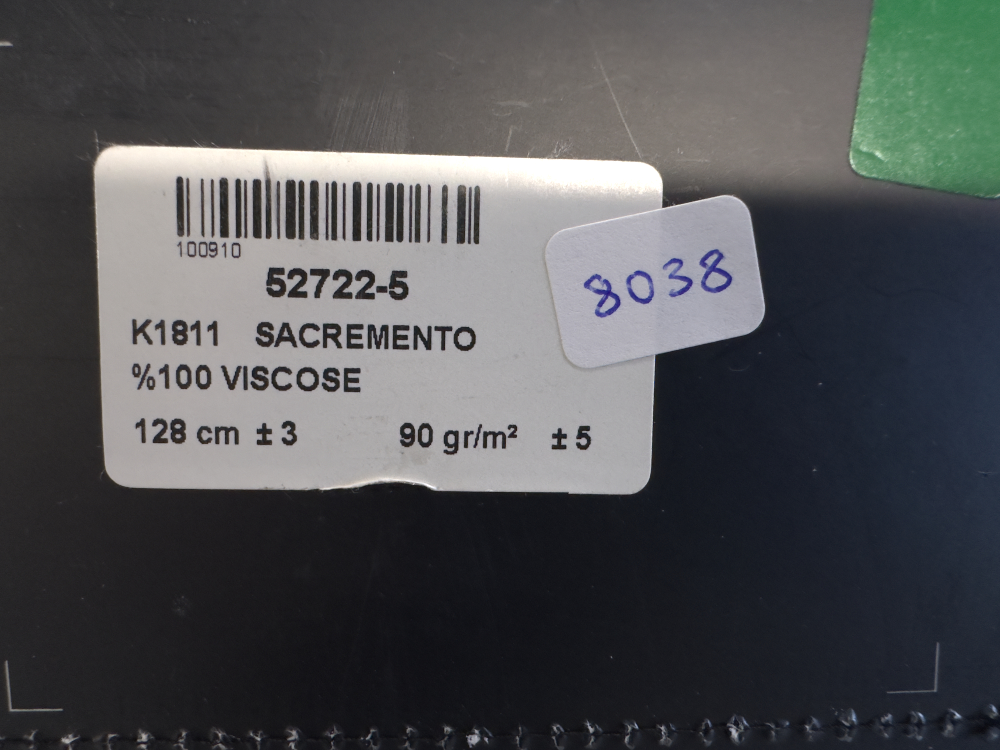

In [51]:
im